In [8]:
import pandas as pd 
import numpy as np 
import os 

In [9]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
from invesscience.joanna_merge import get_training_data

In [19]:
companies = get_training_data(reference="a")

In [33]:
companies.head()

,id,normalized_name,category_code,founded_at,description,closed_at,exit,exit_date,country_code,state_code,...,degree_count,MBA_bool,cs_bool,phd_bool,founder_count,n_female_founders,female_ratio,mean_comp_founded_ever,mean_comp_founded_before,target
0,c:1349,move networks,software,NaT,software Move Networks is a streaming tech pla...,NaN,acquisition,1987-06-16 00:00:00,USA,CA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,c:4584,modern feed,games_video,2007-01-01,games_video [Modern Feed](http://www.moder...,NaN,acquisition,1987-06-16 00:00:00,USA,CA,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1
2,c:16612,micron technology,semiconductor,1978-01-01,semiconductor Semiconductor Applications Mic...,NaN,ipo,1990-01-02 00:00:00,USA,ID,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,c:28,cisco,network_hosting,1984-01-01,network_hosting Cisco designs and sells ha...,NaN,ipo,1990-02-23 00:00:00,USA,CA,...,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1
4,c:29,yahoo,web,1994-01-01,web News and On-line directory Yahoo was fou...,NaN,ipo,1996-04-12 00:00:00,USA,CA,...,2.2,1.0,1.0,1.0,5.0,0.0,0.0,1.2,0.0,1


In [24]:
!pip install pandas_profiling
import pandas_profiling
companies.profile_report()

In [25]:
companies.head()

,id,normalized_name,category_code,founded_at,description,closed_at,exit,exit_date,country_code,state_code,...,degree_count,MBA_bool,cs_bool,phd_bool,founder_count,n_female_founders,female_ratio,mean_comp_founded_ever,mean_comp_founded_before,target
0,c:1349,move networks,software,NaT,software Move Networks is a streaming tech pla...,NaN,acquisition,1987-06-16 00:00:00,USA,CA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,c:4584,modern feed,games_video,2007-01-01,games_video [Modern Feed](http://www.moder...,NaN,acquisition,1987-06-16 00:00:00,USA,CA,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1
2,c:16612,micron technology,semiconductor,1978-01-01,semiconductor Semiconductor Applications Mic...,NaN,ipo,1990-01-02 00:00:00,USA,ID,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,c:28,cisco,network_hosting,1984-01-01,network_hosting Cisco designs and sells ha...,NaN,ipo,1990-02-23 00:00:00,USA,CA,...,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1
4,c:29,yahoo,web,1994-01-01,web News and On-line directory Yahoo was fou...,NaN,ipo,1996-04-12 00:00:00,USA,CA,...,2.2,1.0,1.0,1.0,5.0,0.0,0.0,1.2,0.0,1


# Outliers

In [49]:
companies['founded_at'].max()

Timestamp('2013-06-01 00:00:00')

# checking collinearitty (seems good)

In [32]:
companies.corr().style.background_gradient(cmap='coolwarm')

,participants_a,raised_amount_usd_a,timediff_founded_series_a,rounds_before_a,phd,MBA,cs,graduate,undergrad,professional,degree_count,MBA_bool,cs_bool,phd_bool,founder_count,n_female_founders,female_ratio,mean_comp_founded_ever,mean_comp_founded_before,target
participants_a,1.000000,0.120331,0.011537,0.047544,0.058738,-0.005955,0.069419,0.019737,0.069870,-0.017446,0.061820,0.017112,0.071069,0.054786,0.061894,-0.043229,-0.044704,0.041198,0.042627,0.105371
raised_amount_usd_a,0.120331,1.000000,0.078751,-0.029280,0.046817,-0.010728,-0.025743,0.106264,0.044979,-0.016553,0.079658,-0.006099,-0.037453,0.050825,-0.019359,-0.047753,-0.050420,0.042703,0.042206,0.006475
timediff_founded_series_a,0.011537,0.078751,1.000000,-0.030882,-0.017595,-0.100347,-0.087493,0.037580,-0.116576,0.024311,-0.088698,-0.114038,-0.104390,-0.019920,-0.090059,0.008639,0.042692,0.002622,-0.001676,-0.069135
rounds_before_a,0.047544,-0.029280,-0.030882,1.000000,-0.046943,-0.015018,-0.016531,0.008411,-0.032753,0.019378,-0.032235,-0.013785,-0.000816,-0.037490,0.087413,0.000723,-0.009922,-0.005725,0.003604,0.059001
phd,0.058738,0.046817,-0.017595,-0.046943,1.000000,-0.043544,0.108140,0.160303,0.132363,-0.002517,0.399249,-0.030582,0.088861,0.896127,-0.012991,-0.017905,-0.023715,-0.034568,-0.019974,-0.068838
MBA,-0.005955,-0.010728,-0.100347,-0.015018,-0.043544,1.000000,0.062364,0.056959,0.320131,-0.001990,0.531934,0.883460,0.059881,-0.027911,-0.024949,0.018275,0.029307,0.087571,0.073623,0.051348
cs,0.069419,-0.025743,-0.087493,-0.016531,0.108140,0.062364,1.000000,0.226925,0.344939,-0.020804,0.344601,0.059198,0.896200,0.125238,0.019812,-0.055251,-0.061512,0.080252,0.076305,0.056186
graduate,0.019737,0.106264,0.037580,0.008411,0.160303,0.056959,0.226925,1.000000,0.187197,-0.015455,0.596299,0.074116,0.199738,0.169413,0.001373,-0.016361,-0.011021,0.003305,-0.004899,-0.021947
undergrad,0.069870,0.044979,-0.116576,-0.032753,0.132363,0.320131,0.344939,0.187197,1.000000,-0.014858,0.797647,0.301253,0.335680,0.142224,-0.012800,-0.009485,-0.018904,0.096063,0.076293,0.020026
professional,-0.017446,-0.016553,0.024311,0.019378,-0.002517,-0.001990,-0.020804,-0.015455,-0.014858,1.000000,0.019403,-0.002488,-0.023213,0.009969,-0.001496,-0.011398,-0.011117,-0.012511,-0.009604,0.015055


In [34]:
import seaborn as sns

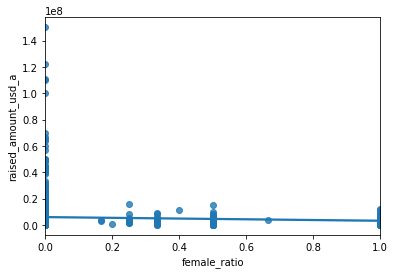

In [39]:
sns.regplot('female_ratio', 'raised_amount_usd_a', data=companies)

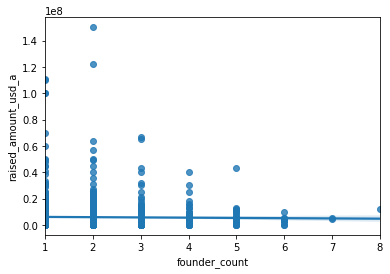

In [40]:
sns.regplot('founder_count', 'raised_amount_usd_a', data=companies)

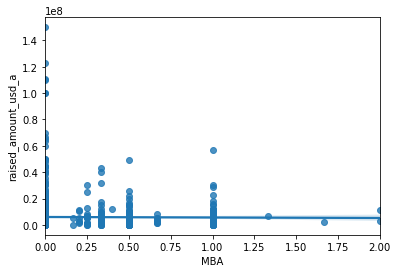

In [41]:
sns.regplot('MBA', 'raised_amount_usd_a', data=companies)

# Heat map of the reccurence of state_code 

In [28]:
!pip install plotly

     |████████████████████████████████| 13.1 MB 5.0 MB/s eta 0:00:01
  Using cached retrying-1.3.3.tar.gz (10 kB)
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11430 sha256=c4dc9167ebacbc422bd8f247e24bcab1a2a00fc8ed62aa744987dcd7d302ae23
  Stored in directory: /Users/henrilehodey/Library/Caches/pip/wheels/c4/a7/48/0a434133f6d56e878ca511c0e6c38326907c0792f67b476e56
Successfully built retrying


In [31]:


import plotly.express as px  # Be sure to import express
fig = px.choropleth(companies,  # Input Pandas DataFrame
                    locations="state",  # DataFrame column with locations
                    color="value",  # DataFrame column with color values
                    hover_name="state", # DataFrame column hover info
                    locationmode = 'USA-states') # Set to plot as US States
fig.update_layout(
    title_text = 'State Rankings', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

ValueError: Value of 'hover_name' is not the name of a column in 'data_frame'. Expected one of ['id', 'normalized_name', 'category_code', 'founded_at', 'description', 'closed_at', 'exit', 'exit_date', 'country_code', 'state_code', 'date_series_a', 'participants_a', 'raised_amount_usd_a', 'timediff_founded_series_a', 'rounds_before_a', 'phd', 'MBA', 'cs', 'graduate', 'undergrad', 'professional', 'degree_count', 'MBA_bool', 'cs_bool', 'phd_bool', 'founder_count', 'n_female_founders', 'female_ratio', 'mean_comp_founded_ever', 'mean_comp_founded_before', 'target'] but received: state